# Support Vector Machines and Kernels

## Introduction

We will be using the wine quality data set for these exercises. This data set contains various chemical properties of wine, such as acidity, sugar, pH, and alcohol. It also contains a quality metric (3-9, with highest being better) and a color (red or white). The name of the file is `Wine_Quality_Data.csv`.

**You can find more information [here](http://archive.ics.uci.edu/ml/datasets/Wine).**

5.png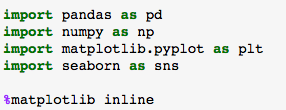

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

6.png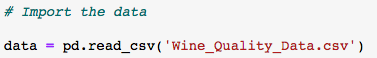

In [2]:
# Import the data
data = pd.read_csv('Wine_Quality_Data.csv')

7.png

In [3]:
data.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


8.png

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         6497 non-null   float64
 1   volatile_acidity      6497 non-null   float64
 2   citric_acid           6497 non-null   float64
 3   residual_sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free_sulfur_dioxide   6497 non-null   float64
 6   total_sulfur_dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  color                 6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
fixed_acidity           6497 non-null float64
volatile_acidity        6497 non-null float64
citric_acid             6497 non-null float64
residual_sugar          6497 non-null float64
chlorides               6497 non-null float64
free_sulfur_dioxide     6497 non-null float64
total_sulfur_dioxide    6497 non-null float64
density                 6497 non-null float64
pH                      6497 non-null float64
sulphates               6497 non-null float64
alcohol                 6497 non-null float64
quality                 6497 non-null int64
color                   6497 non-null object
dtypes: float64(11), int64(1), object(1)
memory usage: 659.9+ KB


In [5]:
# we do not have NaN-s

9.png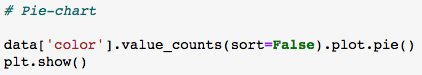

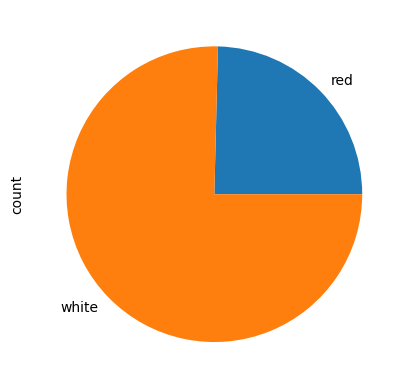

In [5]:
data['color'].value_counts(sort=False).plot.pie()
plt.show()

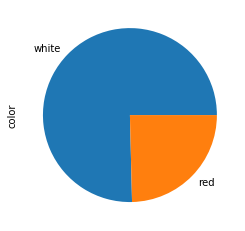

In [7]:
# Create the target variable y as a 1/0 column where 1 means red

10.png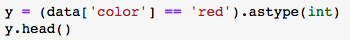

In [6]:
y = (data['color'] == 'red').astype(int)
y.head()

0    1
1    1
2    1
3    1
4    1
Name: color, dtype: int64

0    1
1    1
2    1
3    1
4    1
Name: color, dtype: int64

### Finding correlations

11.png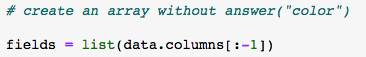

In [7]:
fields = list(data.columns[:-1])

12.png

In [8]:
data.corrwith?

Signature:
data.corrwith(
    other: 'DataFrame | Series',
    axis: 'Axis' = 0,
    drop: 'bool' = False,
    method: 'CorrelationMethod' = 'pearson',
    numeric_only: 'bool' = False,
) -> 'Series'
Docstring:
Compute pairwise correlation.

Pairwise correlation is computed between rows or columns of
DataFrame with rows or columns of Series or DataFrame. DataFrames
are first aligned along both axes before computing the
correlations.

Parameters
----------
other : DataFrame, Series
    Object with which to compute correlations.
axis : {0 or 'index', 1 or 'columns'}, default 0
    The axis to use. 0 or 'index' to compute row-wise, 1 or 'columns' for
    column-wise.
drop : bool, default False
    Drop missing indices from result.
method : {'pearson', 'kendall', 'spearman'} or callable
    Method of correlation:

    * pearson : standard correlation coefficient
    * kendall : Kendall Tau correlation coefficient
    * spearman : Spearman rank correlation
    * callable: callable with inpu

13.png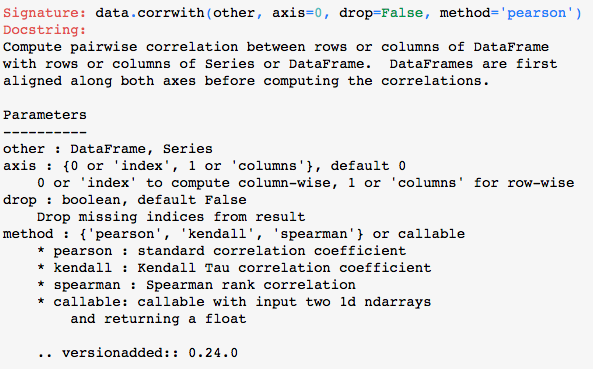

14.png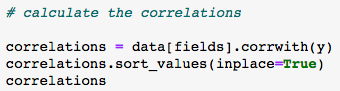

In [9]:
correlations = data[fields].corrwith(y)
correlations.sort_values(inplace=True)
correlations

total_sulfur_dioxide   -0.700357
free_sulfur_dioxide    -0.471644
residual_sugar         -0.348821
citric_acid            -0.187397
quality                -0.119323
alcohol                -0.032970
pH                      0.329129
density                 0.390645
fixed_acidity           0.486740
sulphates               0.487218
chlorides               0.512678
volatile_acidity        0.653036
dtype: float64

total_sulfur_dioxide   -0.700357
free_sulfur_dioxide    -0.471644
residual_sugar         -0.348821
citric_acid            -0.187397
quality                -0.119323
alcohol                -0.032970
pH                      0.329129
density                 0.390645
fixed_acidity           0.486740
sulphates               0.487218
chlorides               0.512678
volatile_acidity        0.653036
dtype: float64

15.png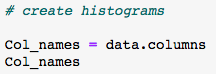

In [10]:
Col_names = data.columns
Col_names

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'color'],
      dtype='object')

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'color'],
      dtype='object')

16.png

In [11]:
data[Col_names].hist();

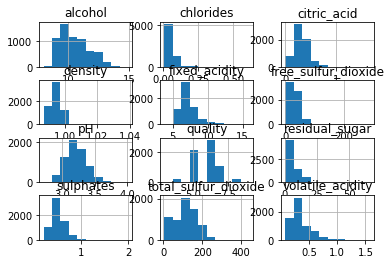

18.png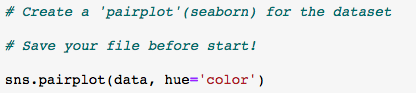

In [12]:
# Save your file before start!
sns.pairplot(data, hue='color')

In [14]:
# Create a 'pairplot'(seaborn) for the dataset

# Save your file before start!

sns.pairplot(data, hue='color')

In [16]:
# describe the result

In [17]:
# Create a bar plot showing the correlations between each column and y

19.png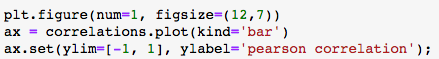

In [15]:
plt.figure(num=1, figsize=(12,7))
ax = correlations.plot(kind='bar')
ax.set(ylim=[-1, 1], ylabel='pearson correlation');

C:\Users\ab2814\AppData\Local\Temp\ipykernel_14496\2813139514.py:1: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  plt.figure(num=1, figsize=(12,7))


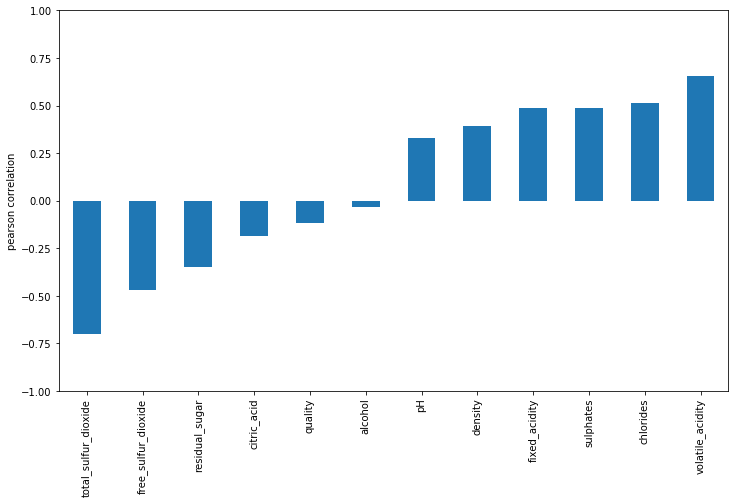

In [20]:
# Pick the most 2 correlated fields (using the absolute value of correlations) and create X

# Use MinMaxScaler to scale X. Note that this will output a np.array 
# Make it a DataFrame again and rename the columns appropriately

21.png

In [16]:
from sklearn.preprocessing import MinMaxScaler

20.png

In [17]:
MinMaxScaler?

Init signature: MinMaxScaler(feature_range=(0, 1), *, copy=True, clip=False)
Docstring:     
Transform features by scaling each feature to a given range.

This estimator scales and translates each feature individually such
that it is in the given range on the training set, e.g. between
zero and one.

The transformation is given by::

    X_std = (X - X.min(axis=0)) / (X.max(axis=0) - X.min(axis=0))
    X_scaled = X_std * (max - min) + min

where min, max = feature_range.

This transformation is often used as an alternative to zero mean,
unit variance scaling.

`MinMaxScaler` doesn't reduce the effect of outliers, but it linearly
scales them down into a fixed range, where the largest occurring data point
corresponds to the maximum value and the smallest one corresponds to the
minimum value. For an example visualization, refer to :ref:`Compare
MinMaxScaler with other scalers <plot_all_scaling_minmax_scaler_section>`.

Read more in the :ref:`User Guide <preprocessing_scaler>`.

Parameters

22.png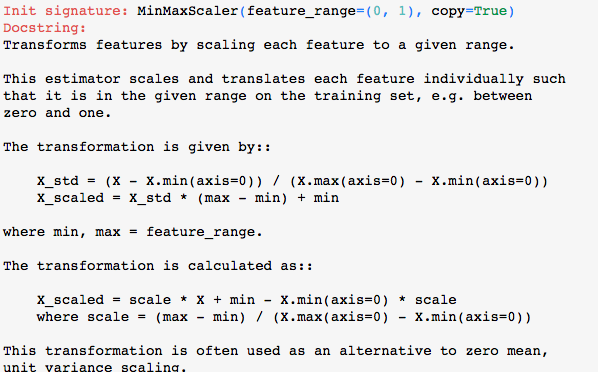

23.png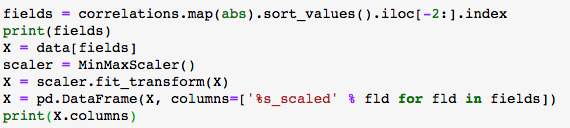

In [18]:
fields = correlations.map(abs).sort_values().iloc[-2:].index
print(fields)
X = data[fields]
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
X = pd.DataFrame(X, columns=['%s_scaled' % fld for fld in fields])
print(X.columns)

Index(['volatile_acidity', 'total_sulfur_dioxide'], dtype='object')
Index(['volatile_acidity_scaled', 'total_sulfur_dioxide_scaled'], dtype='object')


Index(['volatile_acidity', 'total_sulfur_dioxide'], dtype='object')
Index(['volatile_acidity_scaled', 'total_sulfur_dioxide_scaled'], dtype='object')


## Support Vector Machines (SVM)

24.png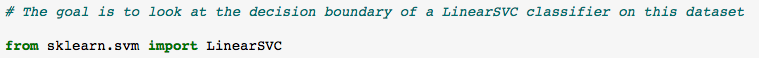

In [19]:
from sklearn.svm import LinearSVC

25.png

In [20]:
LinearSVC?

Init signature:
LinearSVC(
    penalty='l2',
    loss='squared_hinge',
    *,
    dual='auto',
    tol=0.0001,
    C=1.0,
    multi_class='ovr',
    fit_intercept=True,
    intercept_scaling=1,
    class_weight=None,
    verbose=0,
    random_state=None,
    max_iter=1000,
)
Docstring:     
Linear Support Vector Classification.

Similar to SVC with parameter kernel='linear', but implemented in terms of
liblinear rather than libsvm, so it has more flexibility in the choice of
penalties and loss functions and should scale better to large numbers of
samples.

The main differences between :class:`~sklearn.svm.LinearSVC` and
:class:`~sklearn.svm.SVC` lie in the loss function used by default, and in
the handling of intercept regularization between those two implementations.

This class supports both dense and sparse input and the multiclass support
is handled according to a one-vs-the-rest scheme.

Read more in the :ref:`User Guide <svm_classification>`.

Parameters
----------
penalty : {'l1

26.png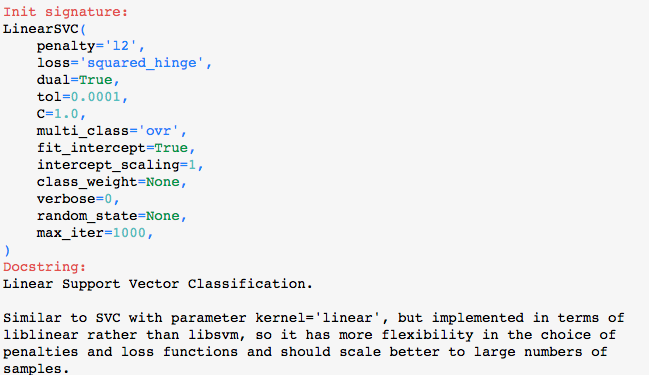

27.png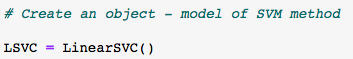

In [21]:
LSVC = LinearSVC()

28.png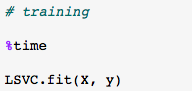

In [22]:
LSVC.fit(X, y)

LinearSVC()

In [28]:
# training

%time

LSVC.fit(X, y)

CPU times: user 5 µs, sys: 2 µs, total: 7 µs
Wall time: 24.1 µs


LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

29.png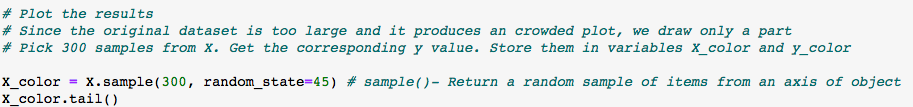

In [23]:
X_color = X.sample(300, random_state=45) # sample()- Return a random sample of items from an axis of object
X_color.tail()

,volatile_acidity_scaled,total_sulfur_dioxide_scaled
358,0.233333,0.039171
5724,0.060000,0.324885
1552,0.400000,0.110599
5746,0.066667,0.315668
64,0.430000,0.011521


,volatile_acidity_scaled,total_sulfur_dioxide_scaled
358,0.233333,0.039171
5724,0.060000,0.324885
1552,0.400000,0.110599
5746,0.066667,0.315668
64,0.430000,0.011521


30.png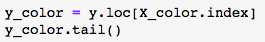

In [24]:
y_color = y.loc[X_color.index]
y_color.tail()

358     1
5724    0
1552    1
5746    0
64      1
Name: color, dtype: int64

358     1
5724    0
1552    1
5746    0
64      1
Name: color, dtype: int64

31.png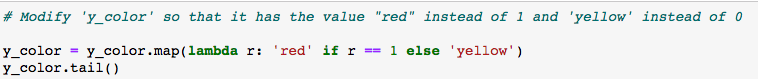

In [25]:
y_color = y_color.map(lambda r: 'red' if r == 1 else 'yellow')
y_color.tail()

358        red
5724    yellow
1552       red
5746    yellow
64         red
Name: color, dtype: object

358        red
5724    yellow
1552       red
5746    yellow
64         red
Name: color, dtype: object

In [77]:
# transpose of a matrix

1.png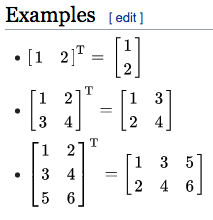

32.png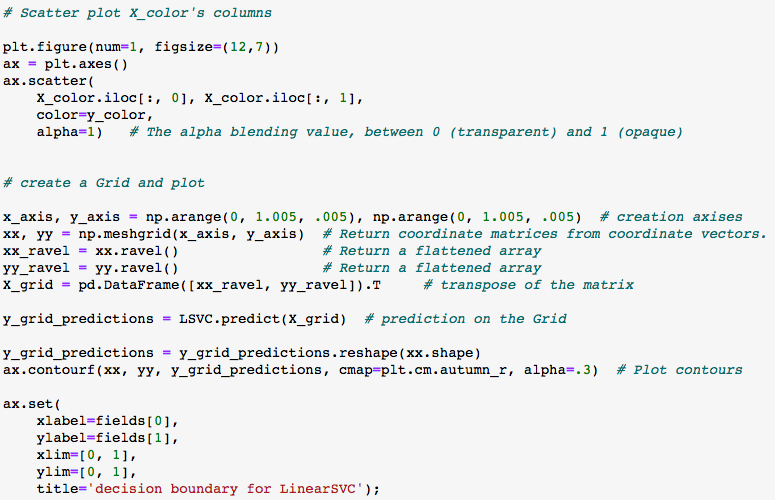

C:\Users\ab2814\AppData\Local\Temp\ipykernel_14496\4268283293.py:3: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  plt.figure(num=1, figsize=(12,7))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(


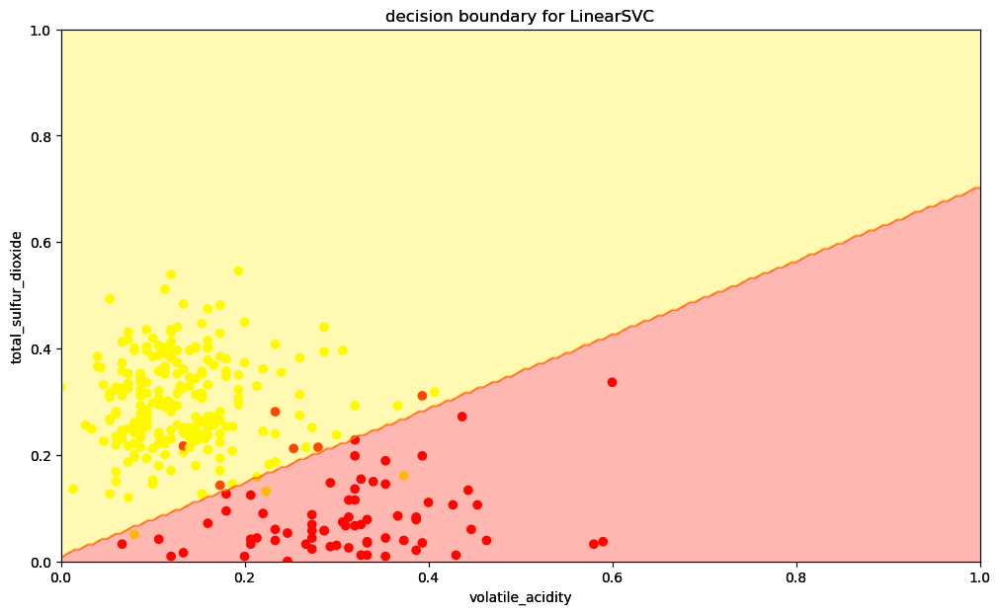

In [34]:
# Scatter plot X_color's columns

plt.figure(num=1, figsize=(12,7))
ax = plt.axes()
ax.scatter(
    X_color.iloc[:, 0], X_color.iloc[:, 1],
    color=y_color,
    alpha=1 # The alpha blending value, between 0 (transparent) and 1 (opaque)
)

# create a Grid and plot
x_axis = np.arange(0, 1.005, .005)
y_axis = np.arange(0, 1.005, .005) # creation axises
xx, yy = np.meshgrid(x_axis, y_axis) # Return coordinate matrices from coordinate vectors.
xx_ravel = xx.ravel()
yy_ravel = yy.ravel() # Return a flattened array
X_grid = pd.DataFrame((xx_ravel, yy_ravel)).T # transpose of the matrix

y_grid_predictions = LSVC.predict(X_grid) # prediction on the Grid

y_grid_predictions = y_grid_predictions.reshape(xx.shape)
ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.autumn_r, alpha=.3) # Plot contours

ax.set(
    xlabel=fields[0],
    ylabel=fields[1],
    xlim=[0, 1],
    ylim=[0, 1],
    title='decision boundary for LinearSVC'
);
plt.show()

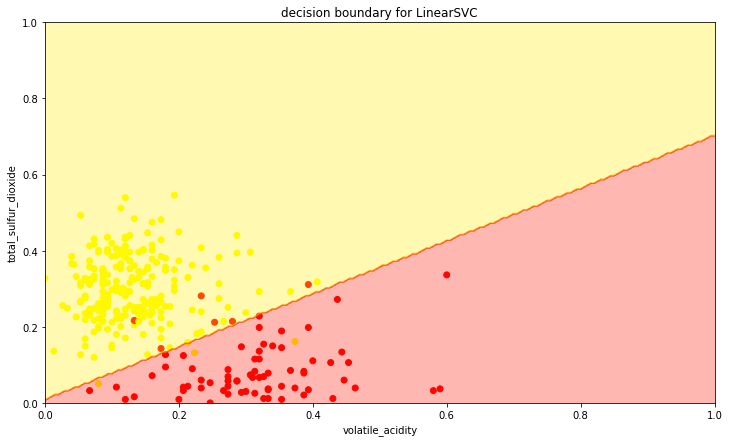

### Universal function for your convenience
 - Consolidate the code snippets from the previous example into one function which takes in an estimator, X and y
 - Produces the final plot with decision boundary

33.png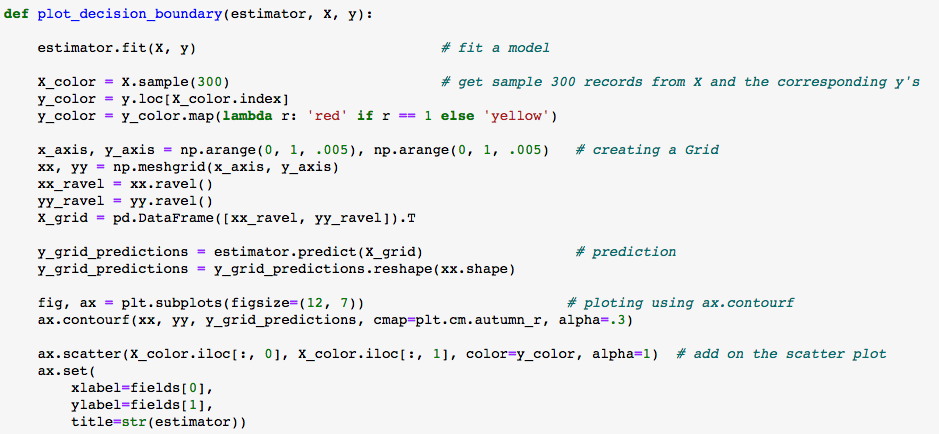

In [30]:
def plot_decision_boundary(estimator, X, y):

    estimator.fit(X, y) # fit a model

    X_color = X.sample(300) # get sample 300 records from X and the corresponding y's
    y_color = y.loc[X_color.index]
    y_color = y_color.map(lambda r: 'red' if r == 1 else 'yellow')

    x_axis = np.arange(0, 1.005, .005)
    y_axis = np.arange(0, 1.005, .005) # creating a Grid
    xx, yy = np.meshgrid(x_axis, y_axis)
    xx_ravel = xx.ravel()
    yy_ravel = yy.ravel()
    X_grid = pd.DataFrame((xx_ravel, yy_ravel)).T

    y_grid_predictions = estimator.predict(X_grid) # prediction

    y_grid_predictions = y_grid_predictions.reshape(xx.shape)

    fig, ax = plt.subplots(figsize=(12, 7)) # plotting using ax.contourf
    ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.autumn_r, alpha=.3)

    ax.scatter(X_color.iloc[:, 0], X_color.iloc[:, 1], color=y_color, alpha=1) # add on the scatter plot
    ax.set(
        xlabel=fields[0],
        ylabel=fields[1],
        title=str(estimator)
    )

34.png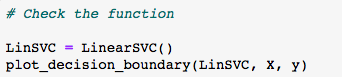

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(


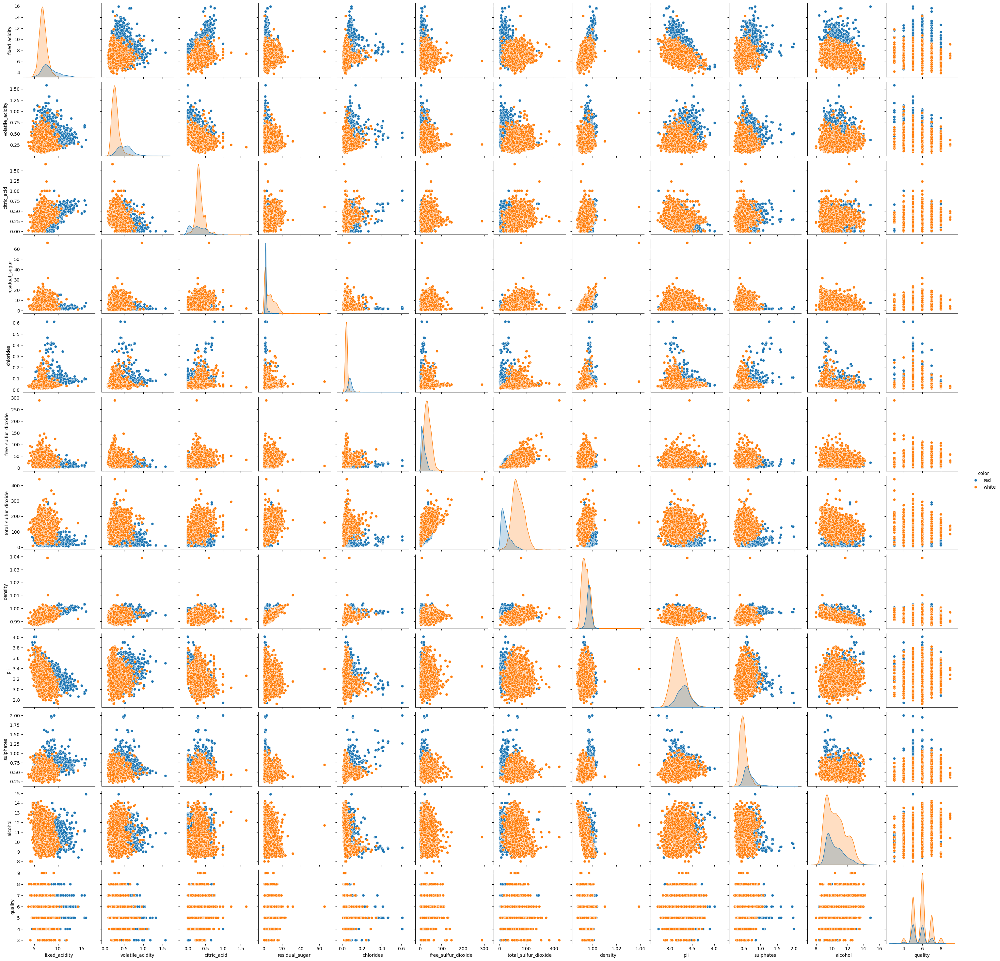

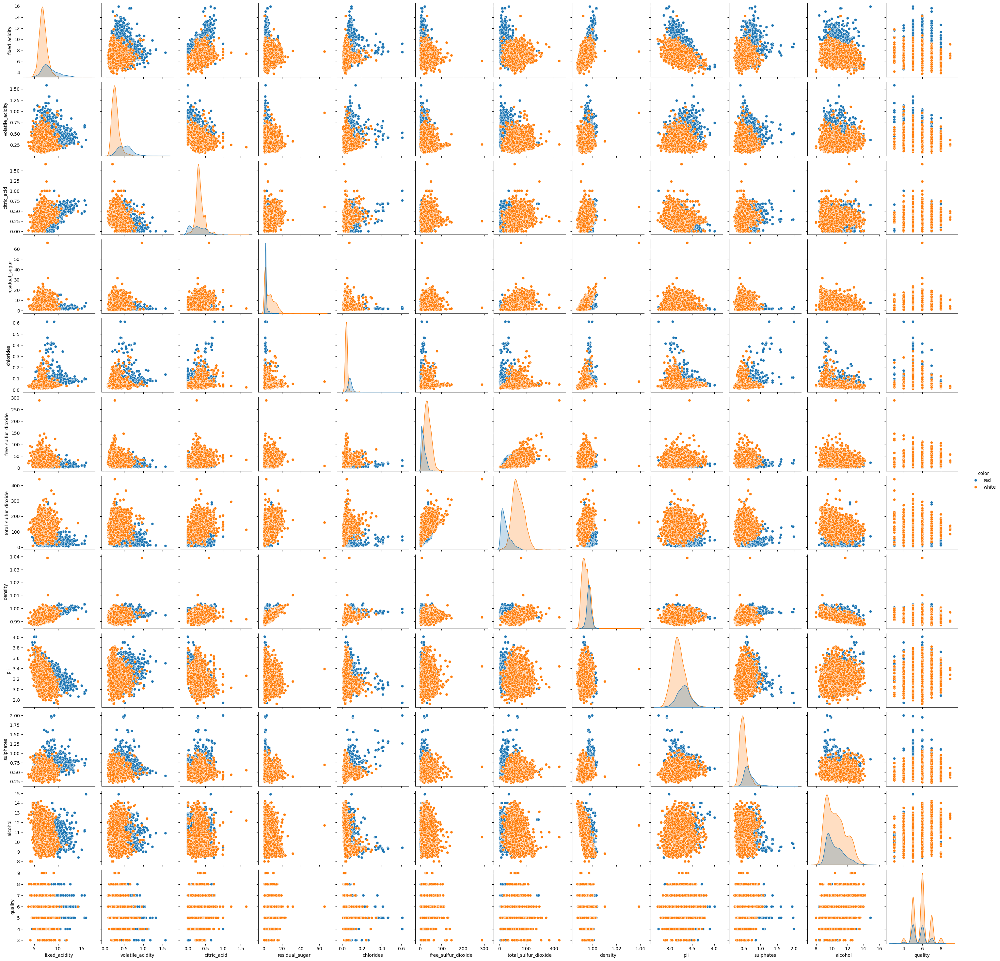

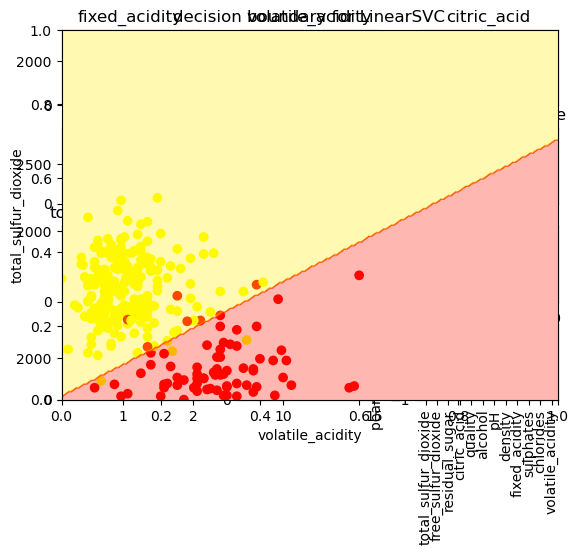

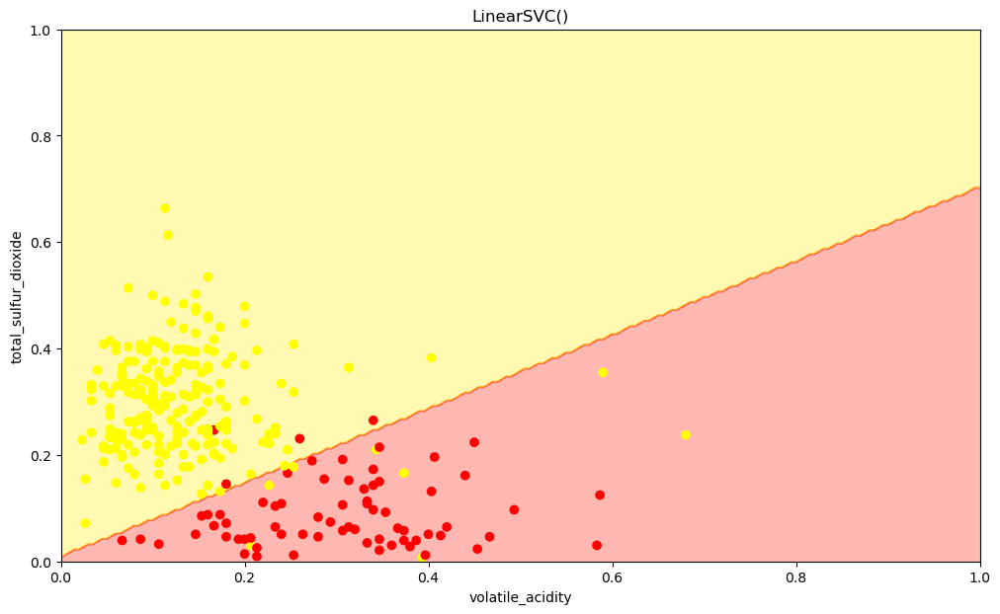

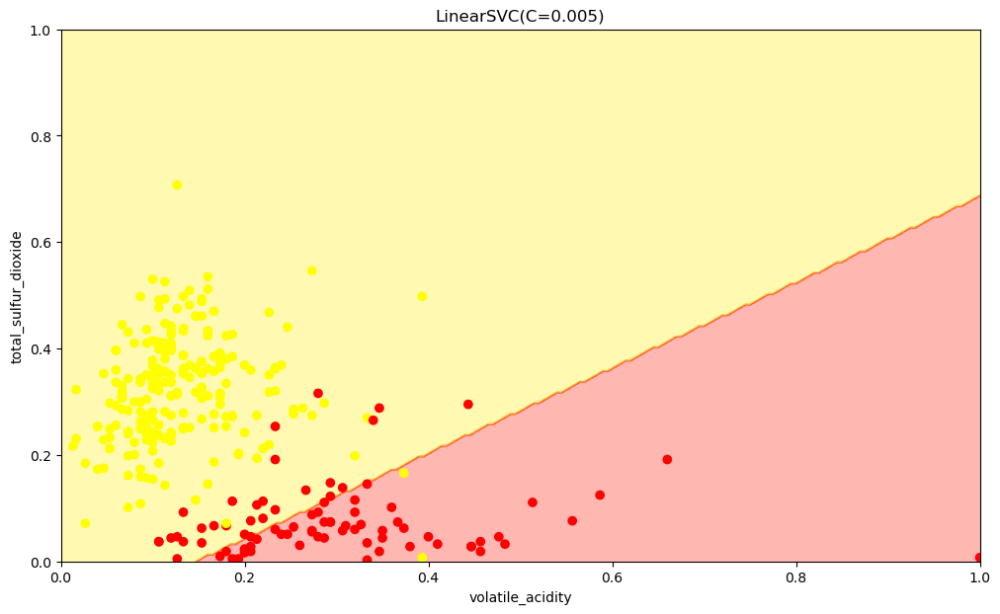

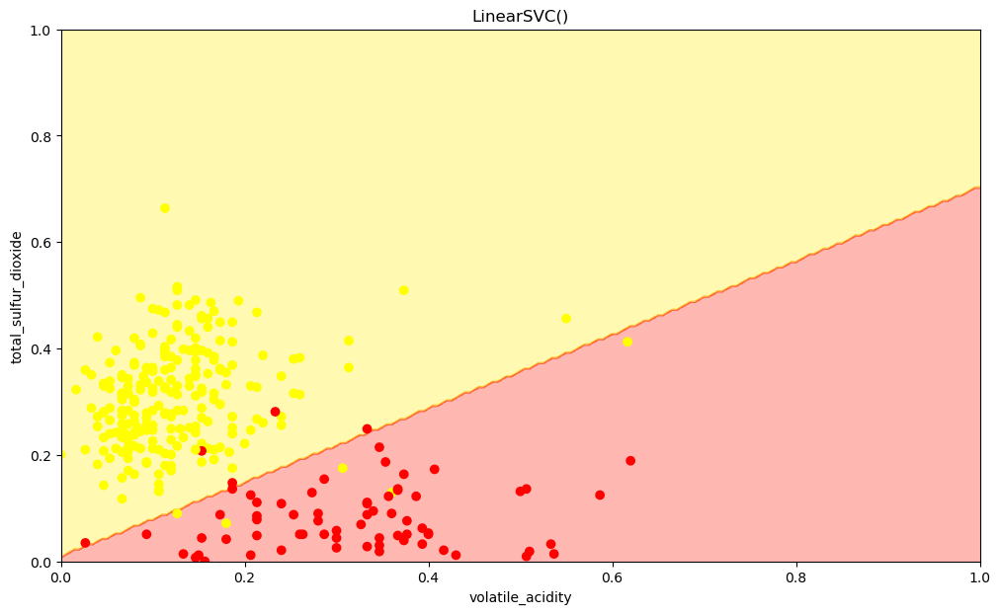

In [31]:
# Check the function
LinSVC = LinearSVC()
plot_decision_boundary(LinSVC, X, y)

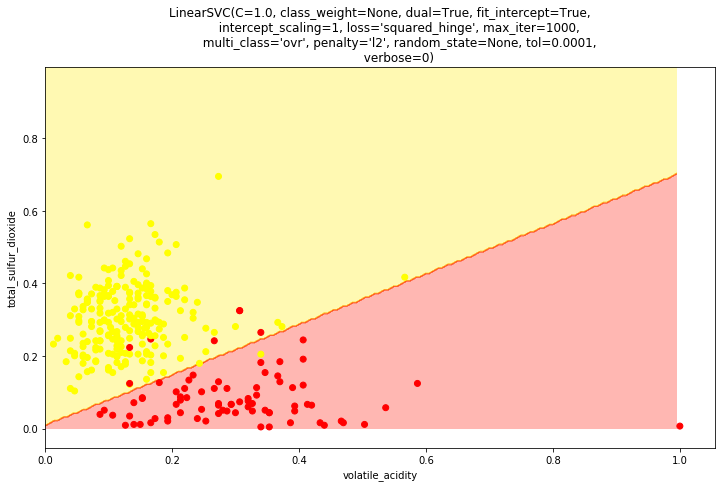

In [ ]:
# we received the similar result

3.png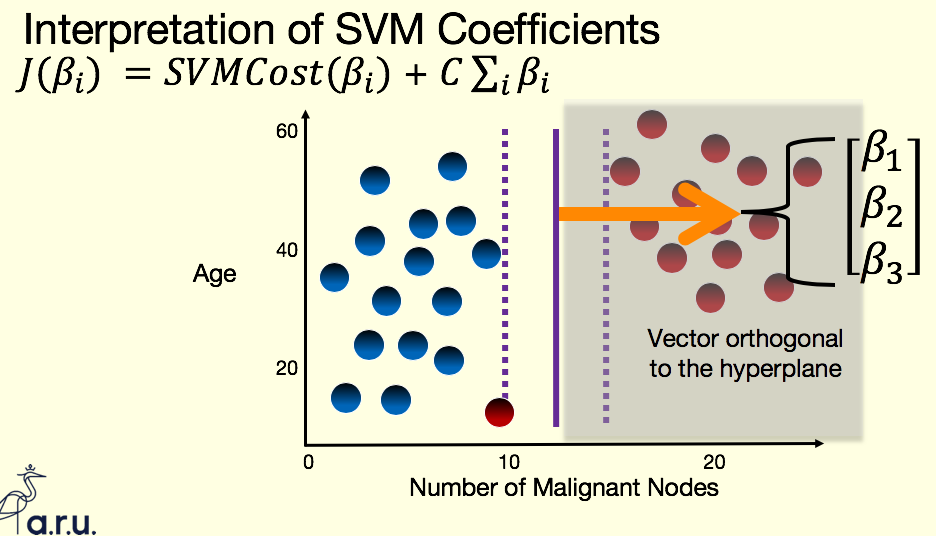

**You can find more information about the Coefficients [here](https://www.csie.ntu.edu.tw/~cjlin/papers/guide/guide.pdf).**

35.png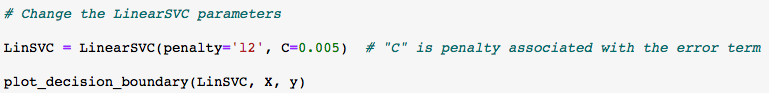

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(


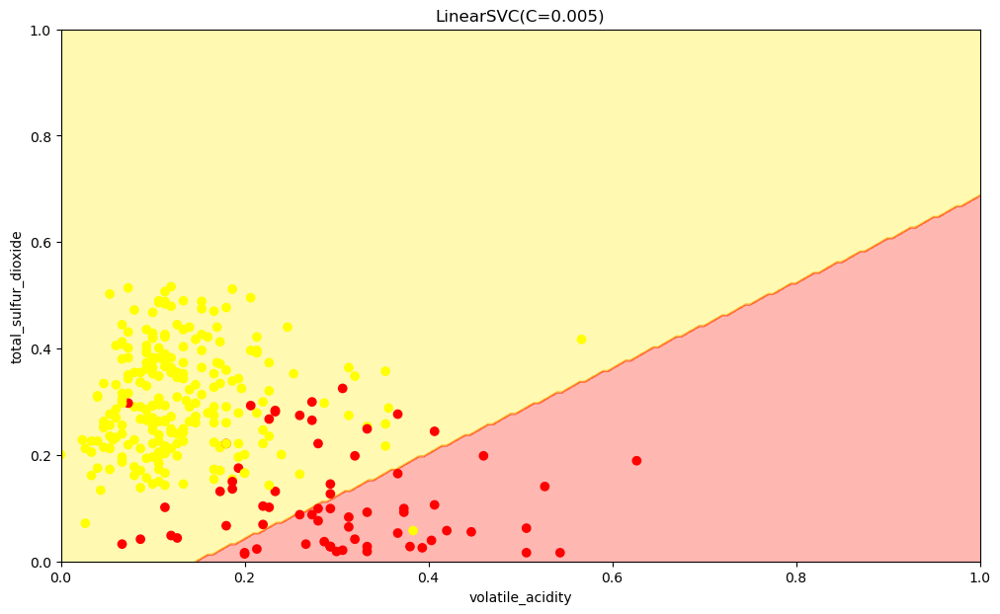

In [32]:
# Change the LinearSVC parameters
LinSVC = LinearSVC(penalty='l2', C=0.005) # "C" is penalty associated with the error term
plot_decision_boundary(LinSVC, X, y)

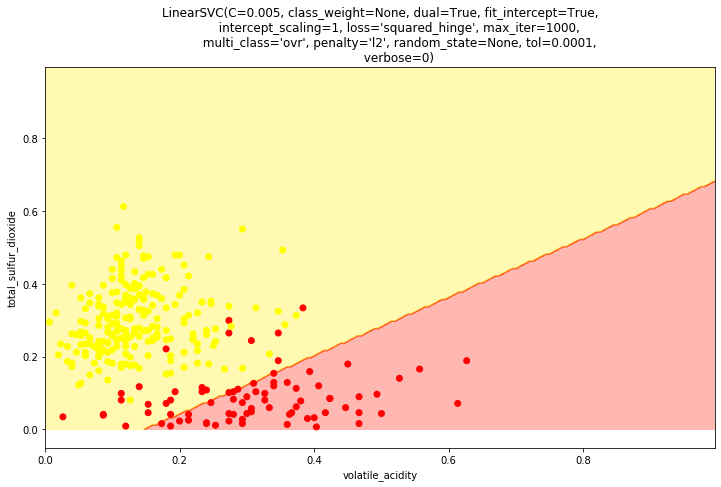

In [131]:
# print the explaination of the result

36.png

In [35]:
LinearSVC?

Init signature:
LinearSVC(
    penalty='l2',
    loss='squared_hinge',
    *,
    dual='auto',
    tol=0.0001,
    C=1.0,
    multi_class='ovr',
    fit_intercept=True,
    intercept_scaling=1,
    class_weight=None,
    verbose=0,
    random_state=None,
    max_iter=1000,
)
Docstring:     
Linear Support Vector Classification.

Similar to SVC with parameter kernel='linear', but implemented in terms of
liblinear rather than libsvm, so it has more flexibility in the choice of
penalties and loss functions and should scale better to large numbers of
samples.

The main differences between :class:`~sklearn.svm.LinearSVC` and
:class:`~sklearn.svm.SVC` lie in the loss function used by default, and in
the handling of intercept regularization between those two implementations.

This class supports both dense and sparse input and the multiclass support
is handled according to a one-vs-the-rest scheme.

Read more in the :ref:`User Guide <svm_classification>`.

Parameters
----------
penalty : {'l1

In [37]:
LinearSVC?

37.png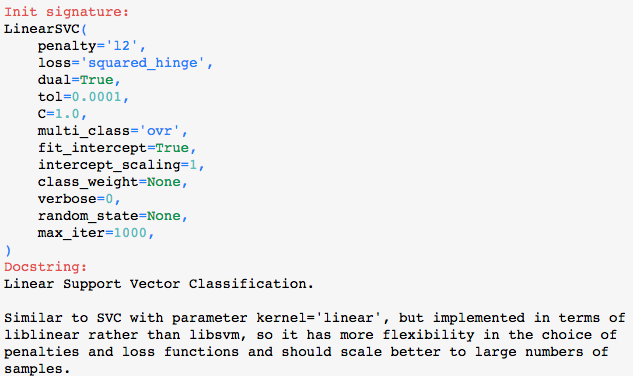

In [ ]:
# Feel free to experiment with different parameter choices for LinearSVC and see the decision boundary!

## Gaussian kernel SVC

4.png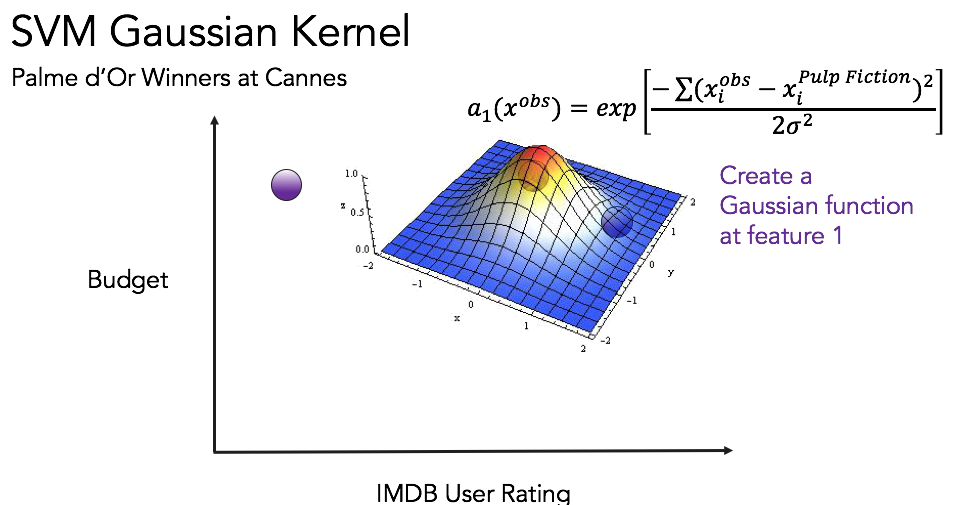

38.png

In [36]:
from sklearn.svm import SVC

39.png

In [37]:
SVC?

Init signature:
SVC(
    *,
    C=1.0,
    kernel='rbf',
    degree=3,
    gamma='scale',
    coef0=0.0,
    shrinking=True,
    probability=False,
    tol=0.001,
    cache_size=200,
    class_weight=None,
    verbose=False,
    max_iter=-1,
    decision_function_shape='ovr',
    break_ties=False,
    random_state=None,
)
Docstring:     
C-Support Vector Classification.

The implementation is based on libsvm. The fit time scales at least
quadratically with the number of samples and may be impractical
beyond tens of thousands of samples. For large datasets
consider using :class:`~sklearn.svm.LinearSVC` or
:class:`~sklearn.linear_model.SGDClassifier` instead, possibly after a
:class:`~sklearn.kernel_approximation.Nystroem` transformer or
other :ref:`kernel_approximation`.

The multiclass support is handled according to a one-vs-one scheme.

For details on the precise mathematical formulation of the provided
kernel functions and how `gamma`, `coef0` and `degree` affect each
other, see the

40.png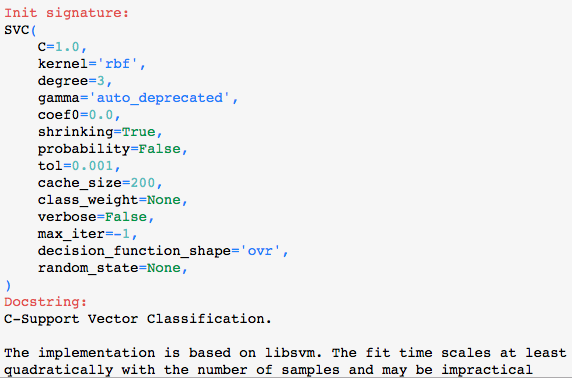

* For the following values of `gamma`, create a Gaussian Kernel SVC and plot the decision boundary  
`gammas = [.5, 1, 2, 10]`

**You can find more information about Gaussian distributions and gamma parameter [here](https://www.csie.ntu.edu.tw/~cjlin/papers/libsvm.pdf).**

41.png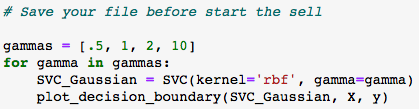

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


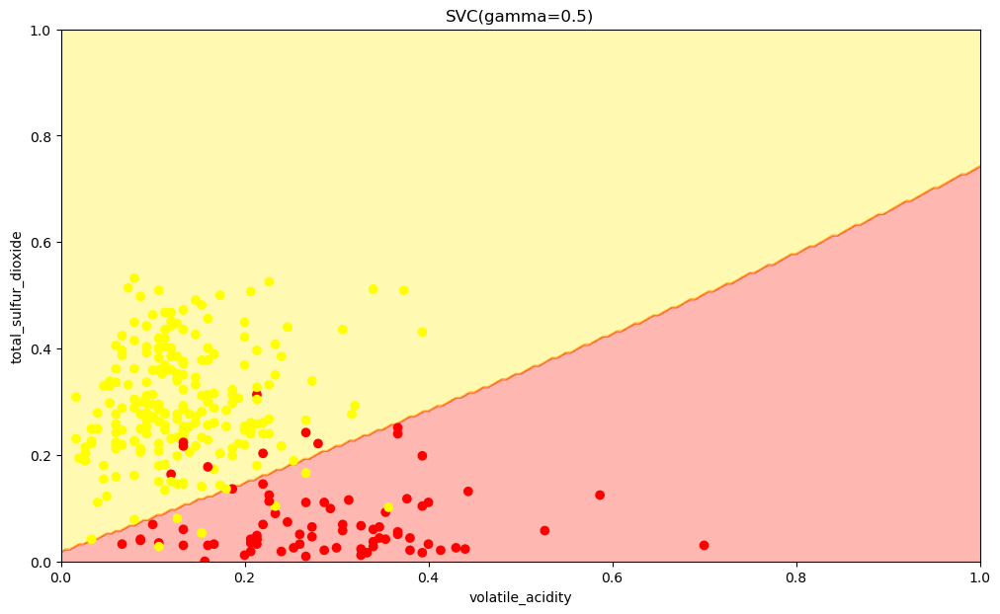

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


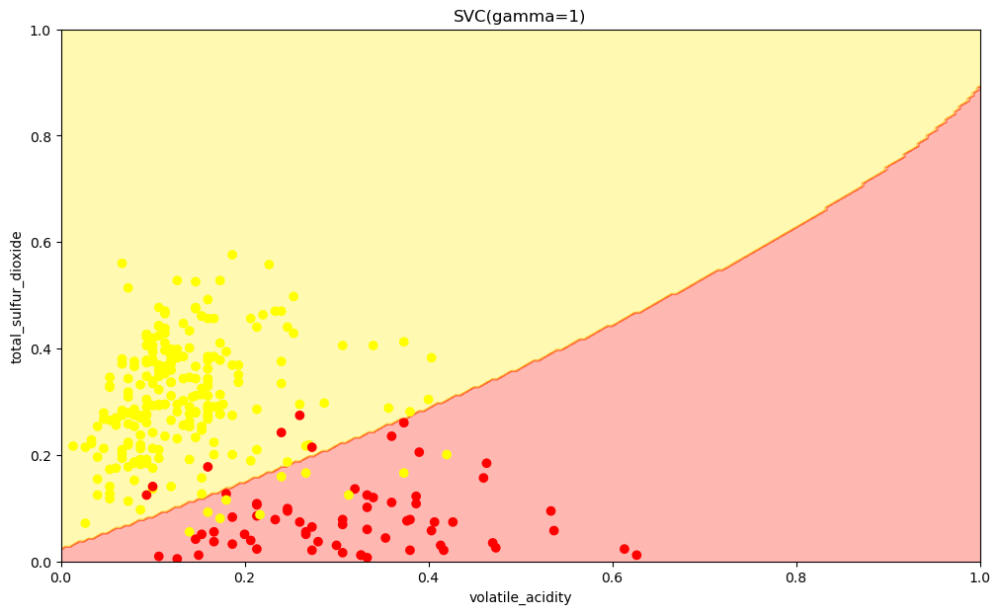

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


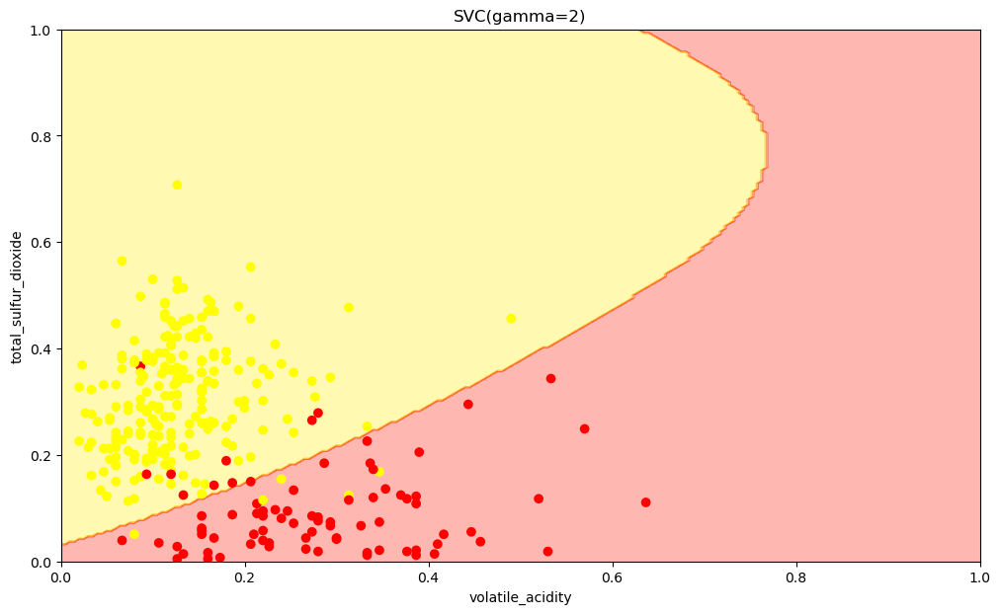

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


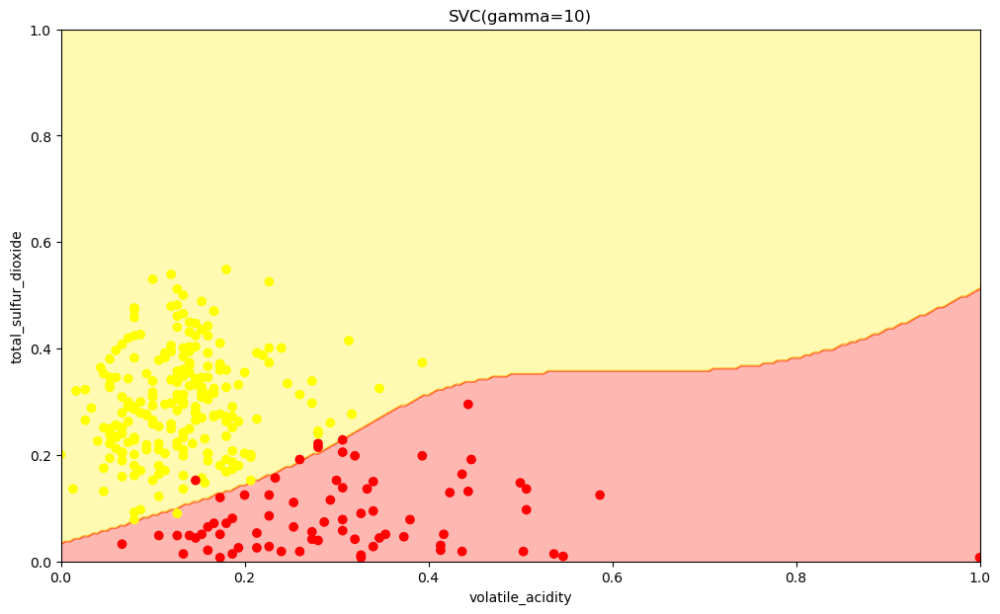

In [38]:
# Save your file before start the cell

gammas = [.5, 1, 2, 10]
for gamma in gammas:
    SVC_Gaussian = SVC(kernel='rbf', gamma=gamma)
    plot_decision_boundary(SVC_Gaussian, X, y)

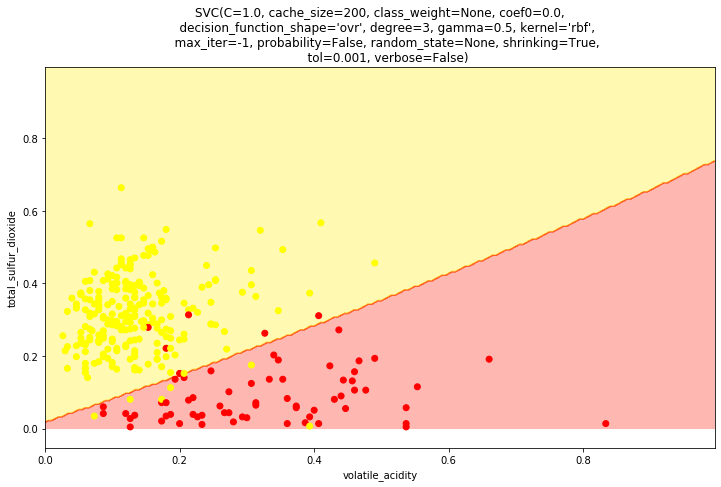

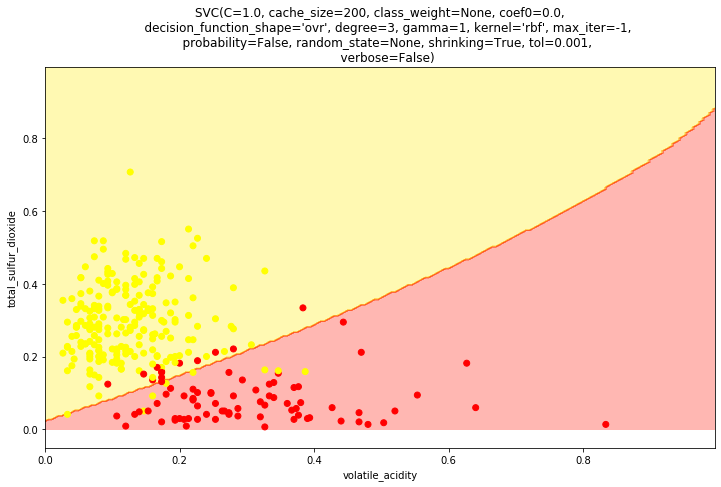

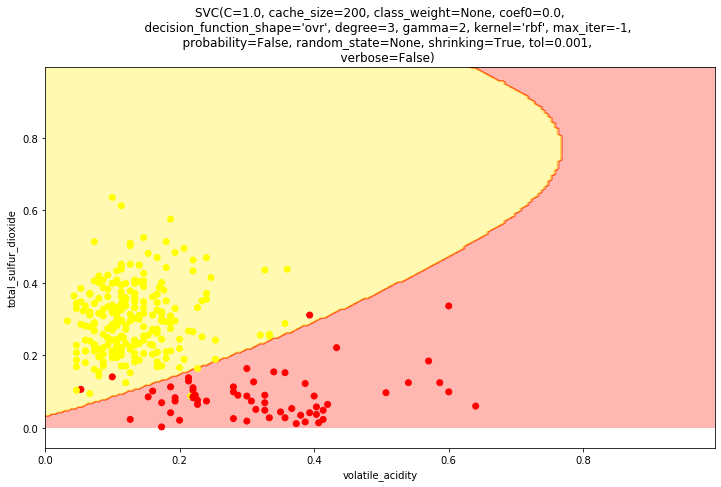

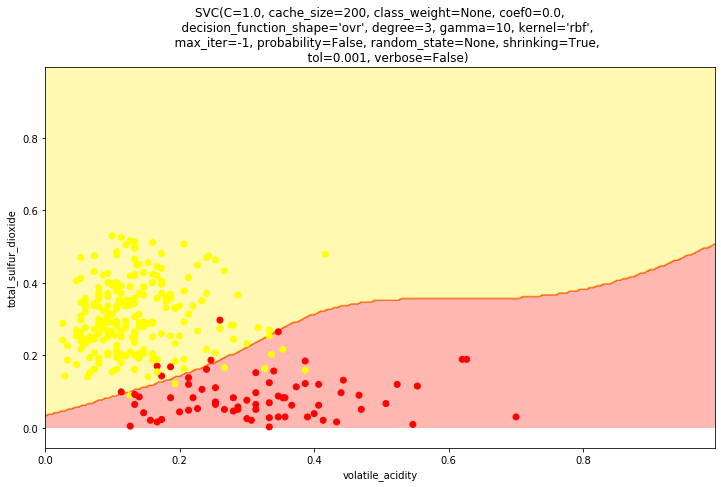

* Holding `gamma` constant, for various values of `C`, plot the decision boundary. You may try  
`Cs = [.1, 1, 10]`

42.png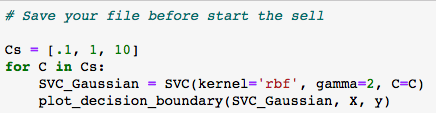

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


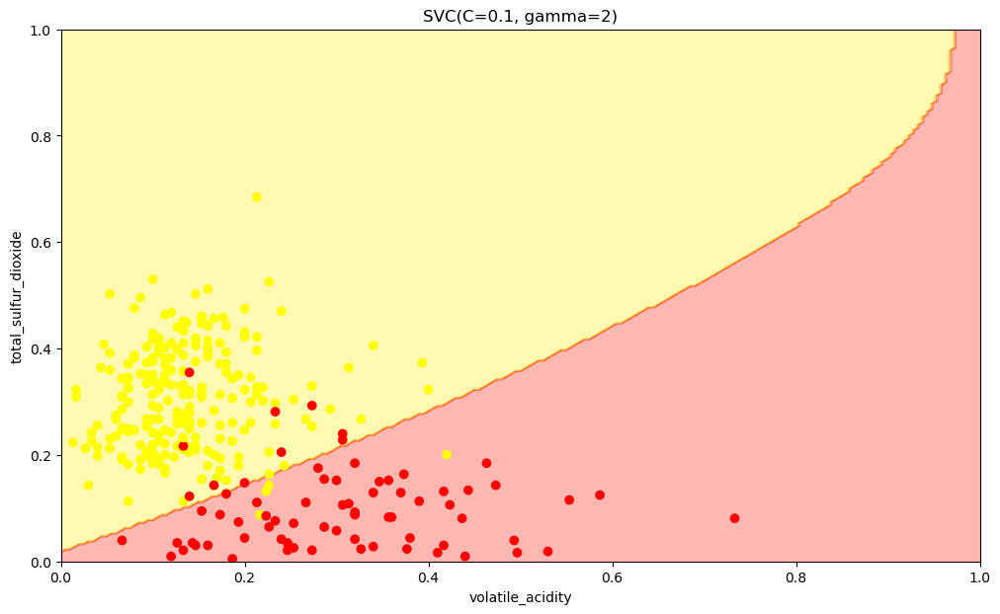

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


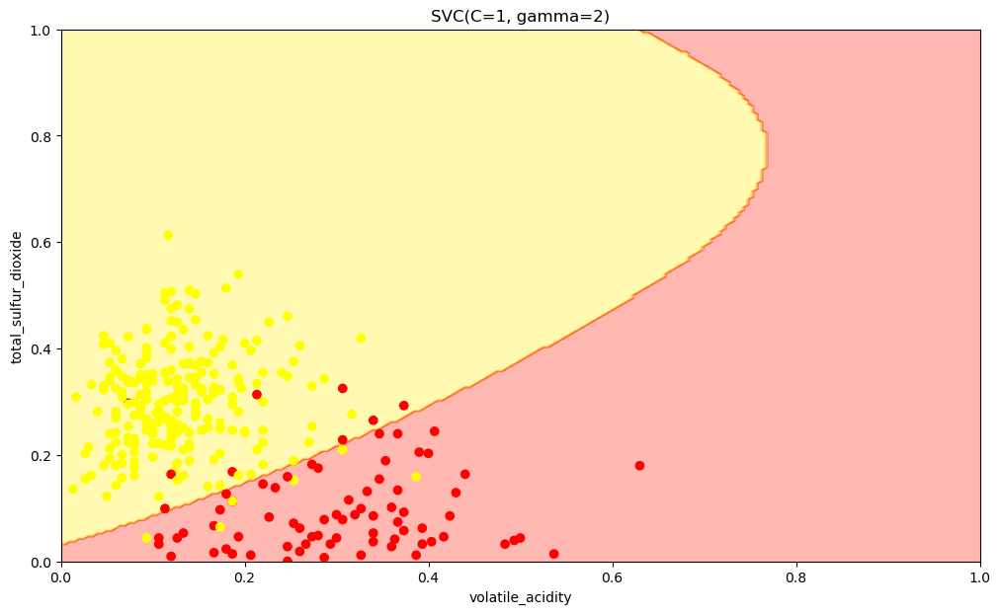

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


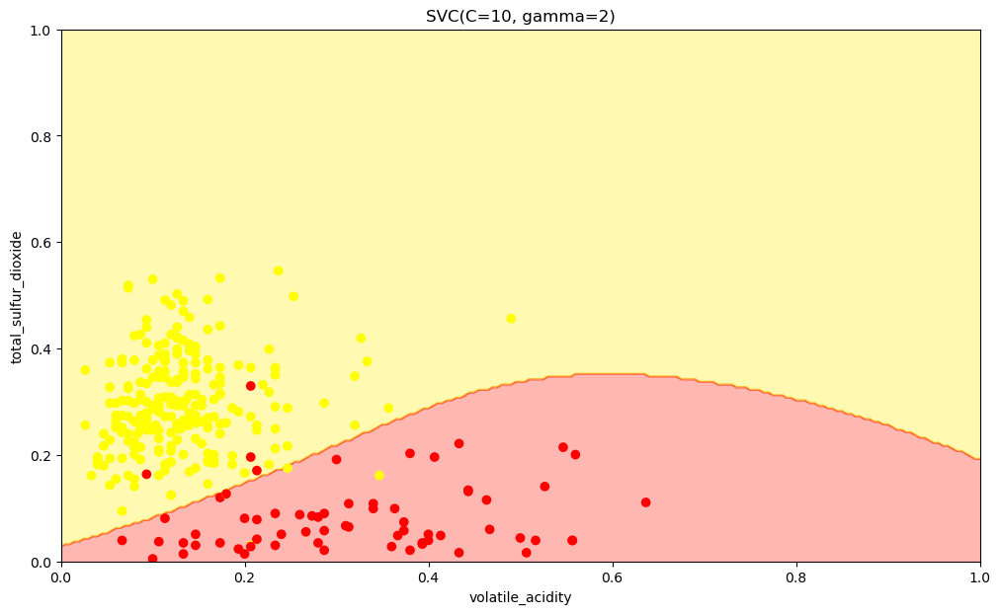

In [39]:
Cs = [.1, 1, 10]
for C in Cs:
    SVC_Gaussian = SVC(kernel='rbf', gamma=2, C=C)
    plot_decision_boundary(SVC_Gaussian, X, y)

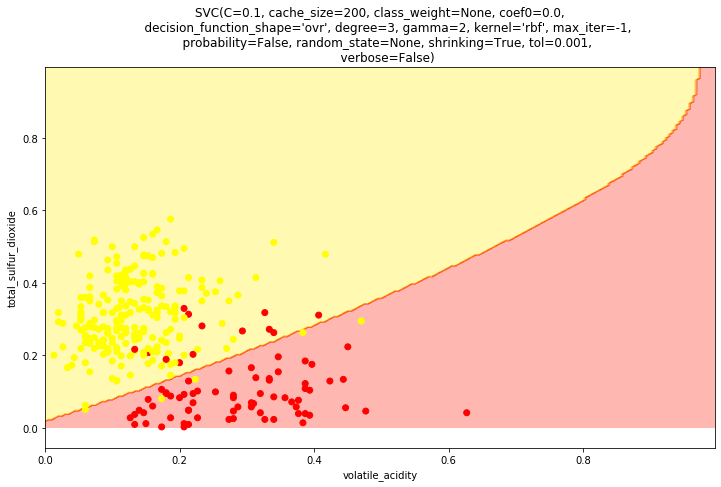

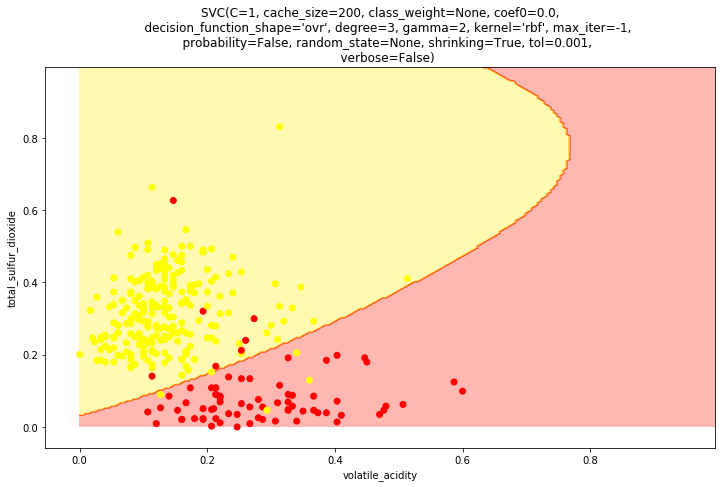

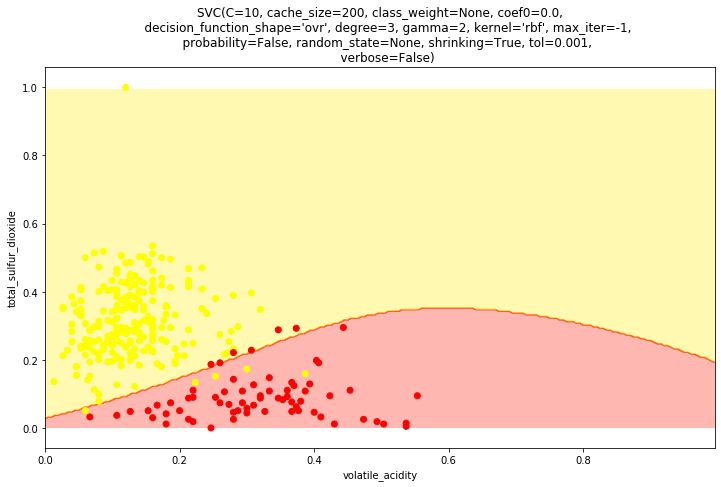

### Faster Kernel Transformations

In [159]:
# we will compare the fitting times between SVC vs Nystroem with rbf kernel

# Notice that this is a transformation method, not a classification method.
# Fit_transform will transform your dataset and put it into a higher dimensional space.
# And then transform will apply the same transformation later.

43.png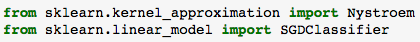

In [40]:
from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import SGDClassifier


44.png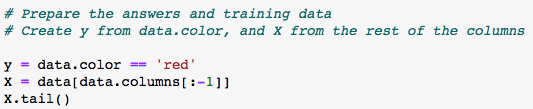

In [41]:

# Prepare the answers and training data
# Create y from data.color, and X from the rest of the columns
y = data.color == 'red'
X = data[data.columns[:-1]]
X.tail()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7
6496,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7
6496,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6


45.png

In [42]:
Nystroem?

Init signature:
Nystroem(
    kernel='rbf',
    *,
    gamma=None,
    coef0=None,
    degree=None,
    kernel_params=None,
    n_components=100,
    random_state=None,
    n_jobs=None,
)
Docstring:     
Approximate a kernel map using a subset of the training data.

Constructs an approximate feature map for an arbitrary kernel
using a subset of the data as basis.

Read more in the :ref:`User Guide <nystroem_kernel_approx>`.

.. versionadded:: 0.13

Parameters
----------
kernel : str or callable, default='rbf'
    Kernel map to be approximated. A callable should accept two arguments
    and the keyword arguments passed to this object as `kernel_params`, and
    should return a floating point number.

gamma : float, default=None
    Gamma parameter for the RBF, laplacian, polynomial, exponential chi2
    and sigmoid kernels. Interpretation of the default value is left to
    the kernel; see the documentation for sklearn.metrics.pairwise.
    Ignored by other kernels.

coef0 : float, defa

46.png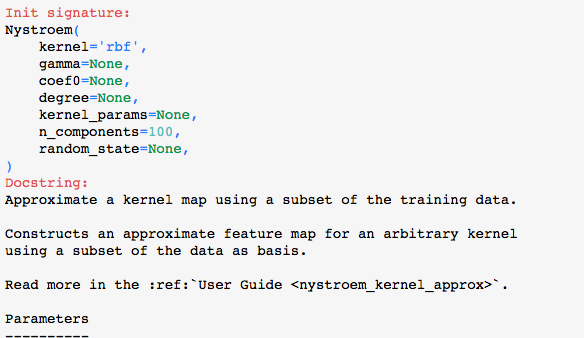

47.png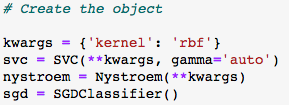

In [49]:
kwargs = {'kernel': 'rbf', 'gamma': 0.1} 
svc = SVC(**kwargs)
nystroem = Nystroem(**kwargs)
sgd = SGDClassifier()

In [47]:
# Use %%timeit to get the time for fitting an SVC with rbf kernel

48.png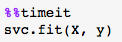

In [50]:
%%timeit
svc.fit(X, y)

668 ms ± 17.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


3.26 s ± 11.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [184]:
# Use %%timeit to get the time for fitting an SVC with rbf kernel

49.png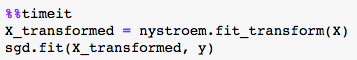

In [51]:
%%timeit
X_transformed = nystroem.fit_transform(X)
sgd.fit(X_transformed, y)

31.4 ms ± 781 μs per loop (mean ± std. dev. of 7 runs, 10 loops each)


241 ms ± 8.83 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [ ]:
# Nystroem+SGD will take much shorter to fit. This difference will be more pronounced if the dataset was bigger